# **CS 725 Project : Extraction of 2D footprints of buildings using LIDAR points**

TEAM MEMBERS:


1. Sona Elza Simon (22D1591) 
2. Apurva Dhingra (22D1592)
3. Sarvesh Gharat (22D1593)
4. Deekshant Kumar (22D1595)
5. Sandhya Dasari  (213040056)

# **Libraries**

In [ ]:
!pip install geemap
!git clone https://github.com/geopandas/geopandas.git
!pip install geopandas
!pip install laspy[lazrs,laszip] 
!pip install folium 
!pip install matplotlib 
!pip install mapclassify
!pip install alphashape

In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [ ]:
# Libraries required for the implementation of ANN

import keras
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [ ]:
# Libraries required for extracting the 2D footprint of the buildings

import geopandas as gpd
import folium
import geemap

from sklearn.cluster import DBSCAN

import alphashape
from descartes import PolygonPatch

import shapely
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 

# **Read the LiDAR data**

In [ ]:
# Mounting to google drive

from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/IIT Bombay/CS 725 Project/')

Mounted at /content/drive


In [ ]:
# Reading lidar data from las file

filename = 'C_37EZ1_7415_sample.las'
las = geemap.read_lidar(filename)
print("Las file details: ",las)

Las file details:  <LasData(1.2, point fmt: <PointFormat(1, 0 bytes of extra dims)>, 1826741 points, 3 vlrs)>


In [ ]:
# Number of lidar points

print("Number of point clouds: ",las.header.point_count)

Number of point clouds:  1826741


In [ ]:
# Lidar data features

print("Features in the las file: \n",list(las.point_format.dimension_names))

Features in the las file: 
 ['X', 'Y', 'Z', 'intensity', 'return_number', 'number_of_returns', 'scan_direction_flag', 'edge_of_flight_line', 'classification', 'synthetic', 'key_point', 'withheld', 'scan_angle_rank', 'user_data', 'point_source_id', 'gps_time']


# **Data Pre-processing**

In [ ]:
# Creating dataframe using selected features

df = pd.DataFrame(np.hstack((las.X[:,None], las.Y[:,None], las.Z[:, None], las.return_number[:,None], las.classification[:,None], las.intensity[:,None])),
                  columns = ['long', 'lat', 'elev', 'rt_num', 'class', 'intensity'])
df.head()

,long,lat,elev,rt_num,class,intensity
0,83150336,439662362,313,1,1,141
1,83150412,439662657,-39,1,1,126
2,83150429,439662496,-883,2,1,13
3,83150513,439662685,-1709,1,2,248
4,83150298,439660188,-1690,1,2,447


In [ ]:
# Scaling longtitude and latitude

df['long'] = (df['long']/1000)
df['lat'] = (df['lat']/1000)
df.head()

,long,lat,elev,rt_num,class,intensity
0,83150.336,439662.362,313,1,1,141
1,83150.412,439662.657,-39,1,1,126
2,83150.429,439662.496,-883,2,1,13
3,83150.513,439662.685,-1709,1,2,248
4,83150.298,439660.188,-1690,1,2,447


In [ ]:
# Converting to GeoDataFrame geometry

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['long'], df['lat'], crs ="EPSG:28992"))
gdf = gdf.to_crs("EPSG:4326")
gdf.head()

,long,lat,elev,rt_num,class,intensity,geometry
0,83150.336,439662.362,313,1,1,141,POINT (4.34228 51.94077)
1,83150.412,439662.657,-39,1,1,126,POINT (4.34229 51.94077)
2,83150.429,439662.496,-883,2,1,13,POINT (4.34229 51.94077)
3,83150.513,439662.685,-1709,1,2,248,POINT (4.34229 51.94077)
4,83150.298,439660.188,-1690,1,2,447,POINT (4.34228 51.94075)


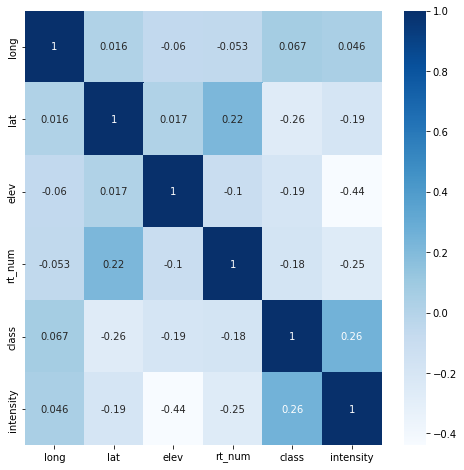

In [ ]:

plt.figure(figsize=(8,8))
sns.heatmap(gdf.corr(),cbar=True,annot=True,cmap='Blues')

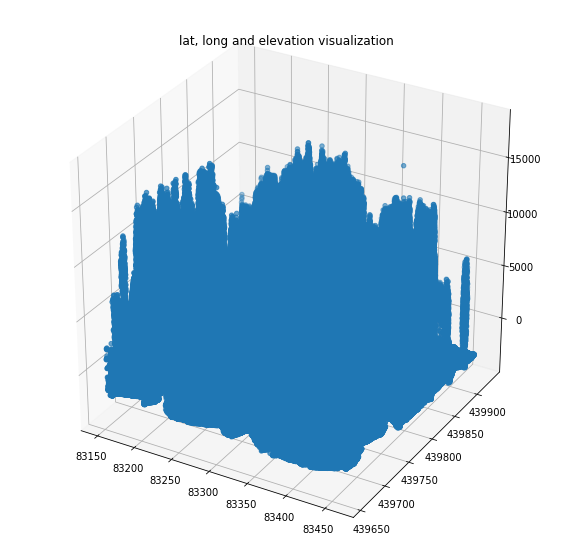

In [ ]:
# Visualizing the 3D lidar points

fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(gdf['long'], gdf['lat'], gdf['elev'], ".")
plt.title("lat, long and elevation visualization")
plt.show()

In [ ]:
# For experimentation, we are using a subset of the Lidar Data

h=gdf[0:180000] 

# **Implementing t-SNE**

In [ ]:
import pandas as pd
temp=pd.read_csv('file8.csv')
temp2= temp.drop("class", axis = 1)
temp2=temp2[temp2.columns[3:8]]
from sklearn.preprocessing import StandardScaler
 
standardized_data = StandardScaler().fit_transform(temp2)
print(standardized_data.shape)

label = temp['class']

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
print (pd.unique(gdf['class']))
data_1000 = data_1000 = standardized_data[0:50000, :]
labels_1000 = label[0:50000]

model = TSNE(n_components = 2, random_state = 0)
# configuring the parameters
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations
# for the optimization = 1000
 
tsne_data = model.fit_transform(data_1000)
print (tsne_data.shape, labels_1000.shape)
# creating a new data frame which
# help us in plotting the result data

print (tsne_data.T.shape, labels_1000.shape)
j=np.vstack((tsne_data.T, labels_1000))
tsne_data = np.vstack((tsne_data.T, labels_1000)).T
tsne_df = pd.DataFrame(data = tsne_data,
     columns =("Dim_1", "Dim_2", "label"))
 
# Plotting the result of tsne
import seaborn
seaborn.FacetGrid(tsne_df, hue ="label", size = 6).map(
       plt.scatter, 'Dim_1', 'Dim_2').add_legend()
 
plt.show()

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px

# df = px.data.iris()

# features = df.loc[:, :'petal_width']



fig = px.scatter_3d(
    tsne_data, x=0, y=1, z=2,
    color=label[0:50000], labels={'color': 'class'}
)
fig.update_traces(marker_size=3)
fig.show()

# **Building Points Extraction Using ANN**

In [ ]:
h.head()

,long,lat,elev,rt_num,class,intensity,geometry
0,83150.336,439662.362,313,1,1,141,POINT (4.34228 51.94077)
1,83150.412,439662.657,-39,1,1,126,POINT (4.34229 51.94077)
2,83150.429,439662.496,-883,2,1,13,POINT (4.34229 51.94077)
3,83150.513,439662.685,-1709,1,2,248,POINT (4.34229 51.94077)
4,83150.298,439660.188,-1690,1,2,447,POINT (4.34228 51.94075)


In [ ]:
# Features
x = h[h.columns[:4]]

# Class labels
y = h['class']

# Renaming the class labels
for i in range (len (y)):
  if y[i]==1 :
    y[i] =0
  if y[i]==2 :
    y[i] =1
  if y[i]==6 :
    y[i] =2
  if y[i]==9 :
    y[i] =3

# Converting y into categorical
y_= to_categorical(y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-p

In [ ]:
# Splitting the data into train and test

X_train, X_test, y_train, y_test = train_test_split(x, y_, test_size = 0.20, random_state = 0)

In [ ]:
# Data Standarization

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

print("X train shape: ",X_train.shape)
print("Y train shape: ",y_train.shape)
print("X test shape: ",X_test.shape)
print("Y test shape: ",y_test.shape)

X train shape:  (144000, 4)
Y train shape:  (144000, 4)
X test shape:  (36000, 4)
Y test shape:  (36000, 4)


In [ ]:
# Neural Network Model Architecture

classifier = Sequential()
classifier.add(Dense(units = 9000, kernel_initializer = 'uniform', activation = 'relu', input_shape = (None,1,4)))
classifier.add(Dense(units = 900, kernel_initializer = 'uniform', activation = 'relu'))
classifier.add(Dense(units = 90, kernel_initializer = 'uniform', activation = 'relu'))
classifier.add(Dense(units = 4, kernel_initializer = 'uniform', activation = 'softmax'))

classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
# Fitting the model

classifier.fit(X_train, y_train, batch_size = 32, epochs = 5)

Epoch 1/5


4500/4500 [==============================] - 22s 4ms/step - loss: 0.1946 - accuracy: 0.9273
Epoch 2/5
4500/4500 [==============================] - 18s 4ms/step - loss: 0.1284 - accuracy: 0.9549
Epoch 3/5
4500/4500 [==============================] - 18s 4ms/step - loss: 0.1151 - accuracy: 0.9605
Epoch 4/5
4500/4500 [==============================] - 21s 5ms/step - loss: 0.1064 - accuracy: 0.9641
Epoch 5/5
4500/4500 [==============================] - 19s 4ms/step - loss: 0.1013 - accuracy: 0.9656


{'loss': [0.19459271430969238,
  0.12844081223011017,
  0.11511264741420746,
  0.10643802583217621,
  0.10126898437738419],
 'accuracy': [0.9273263812065125,
  0.9548680782318115,
  0.9605347514152527,
  0.9640763998031616,
  0.9655972123146057]}

In [ ]:
y_pred = classifier.predict(X_test)

1125/1125 [==============================] - 4s 3ms/step


In [ ]:
y_pred_ = y_pred

for i in range (len (y_test)):
  for j in range (4):
    if (y_pred_[i][j] >0.8):
      y_pred_[i][j] = 1
    else :
      y_pred_[i][j] =0

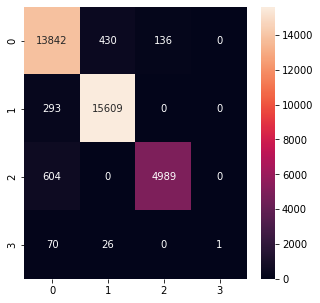

In [ ]:
# Confusion matrix

cm = confusion_matrix(y_test.argmax(axis=1), y_pred_.argmax(axis=1), labels =[0,1,2,3])

fig = plt.figure(figsize = (5, 5))
sns.heatmap(cm, annot=True, fmt='d')

# **2D Building Footprint Using Lidar Points**

## Lidar points of the class : Buildings

In [ ]:
h1=h.loc[h['class'] == 2] # buildings only
h1.head()

,long,lat,elev,rt_num,class,intensity,geometry
27,83150.319,439657.499,1166,1,2,59,POINT (4.34229 51.94073)
49,83150.389,439656.063,1171,1,2,157,POINT (4.34229 51.94071)
50,83150.454,439656.398,1172,1,2,102,POINT (4.34229 51.94072)
51,83150.521,439656.742,1156,1,2,56,POINT (4.34229 51.94072)
52,83150.584,439657.090,1221,1,2,125,POINT (4.34229 51.94072)


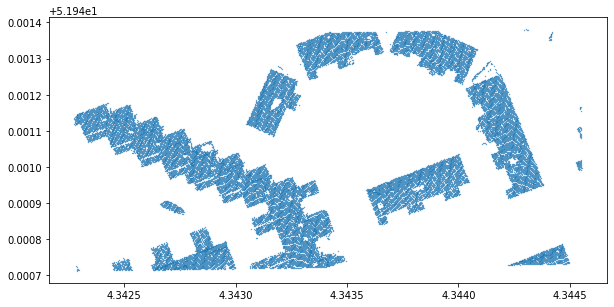

In [ ]:
# Visualizing the building data

h1.plot(figsize = (10,10), markersize=0.1)

In [ ]:
# Plotting the map

h1.explore()

## DBSCAN

In [ ]:
# DBSCAN Clustering

X = h1[['long','lat']]

clusters = DBSCAN(eps=0.5, min_samples=4).fit(X)

n_cluster = len(set(clusters.labels_))
print("Number of clusters obtained from DBSCAN: ",n_cluster)

Number of clusters obtained from DBSCAN:  18


In [ ]:
# Updating the dataframe with the cluster labels

h1 = h1.assign(cluster_label = clusters.labels_)
h1.head(5)

,long,lat,elev,rt_num,class,intensity,geometry,cluster_label
27,83150.319,439657.499,1166,1,2,59,POINT (4.34229 51.94073),0
49,83150.389,439656.063,1171,1,2,157,POINT (4.34229 51.94071),0
50,83150.454,439656.398,1172,1,2,102,POINT (4.34229 51.94072),0
51,83150.521,439656.742,1156,1,2,56,POINT (4.34229 51.94072),0
52,83150.584,439657.090,1221,1,2,125,POINT (4.34229 51.94072),0


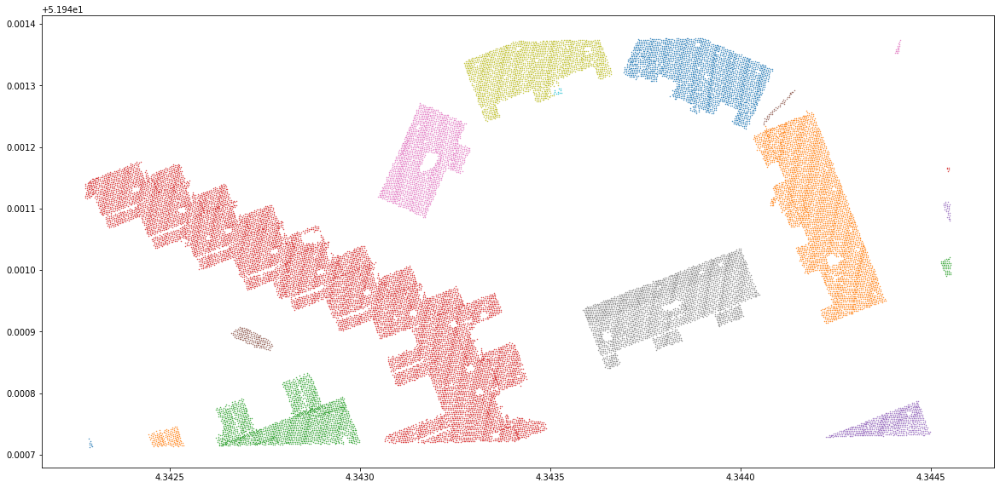

In [ ]:
# Plotting the clusters
ax = h1.plot(figsize = (20,30),c='w',markersize=0.2)
for i in range(0,n_cluster-1):
  h1.loc[h1['cluster_label'] == i].plot(figsize = (20,30), markersize=0.2, ax=ax)

## Alphashape 

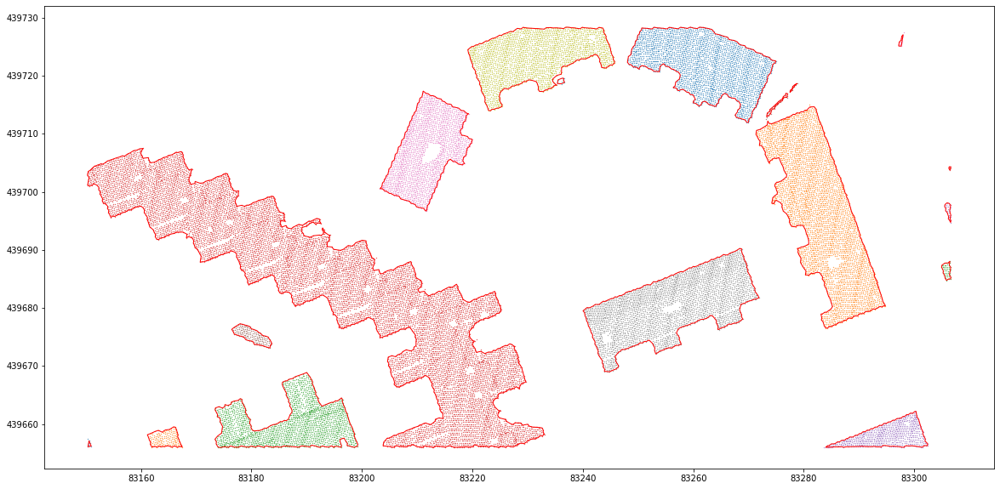

In [ ]:
# Drawing building footprint boundary using AlphaShape

fig, ax = plt.subplots(figsize=(20,10))
for i in range (0,n_cluster-1):
    h2=h1.loc[h1['cluster_label'] == i]
    Y = np.array(h2[['long', 'lat']])
    alpha_shape = alphashape.alphashape(Y,2)
    ax.scatter(*zip(*Y),s=0.1)
    ax.add_patch(PolygonPatch(alpha_shape,fill=False,linewidth=1, ec='r'))
plt.show()

**Visualization**

In [ ]:
# !pip install keplergl
# from keplergl import KeplerGl
# map1= KeplerGl(height=800)
# map1.add_data(data=h1)
# map1